# Incendios en Villa Albertina - Sentinel 2

> "Visualización de imagenes de sentinel 2 respecto a los [incendios](https://www.cadena3.com/noticia/radioinforme-3/continua-el-combate-del-incendio-en-villa-albertina_268066) en Villa Albertina."

- toc: false
- branch: master
- badges: true
- hide_binder_badge: true
- comments: false 

## Banda de Sentinel 2

Sentinel 2 posee 12 bandas que abarcan el rango ~ [400,2200] nm. 

Recordamos las especificaciones de las bandas:

| Banda | Central Wavelenght | Resolution [m] |
|---|---|---|
|1  - Coastal aerosol|  443  |  60 |
|2  - Blue|  490  |  10 |
|3  - Green|  560  |  10 |
|4  - Red|  665  |  10 |
|5  - Vegetation Red Edge|  705  |  20 |
|6  - Vegetation Red Edge|  740  |  20 |
|7  - Vegetation Red Edge|  783  |  20 |
|8  - NIR|  842  |  10 |
|8a - Vegetation Red Edge|  865  |  20 |
|9  - Water vapour|  945  |  60 |
|10 - SWIR Cirrus|  1380 |  60 |
|11 - SWIR|  1610 |  20 |
|12 - SWIR |  2190 |  20 |

Para el presente trabajo tenemos que trabajar con varias de ellas que estan en distinta resolución, por lo cual vamos a resamplear las que correspondan. En general vamos a trabajar a 20 m y las que utilizariamos serian 2,3,4,8,11,12.

La jupyter notebook original de procesamiento se puede encontrar en [src](https://github.com/felixlapalma/incendios-villa-albertina/blob/master/Incendios_Villa_Albertina.ipynb).

In [1]:
#hide
import os,sys
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import tempfile
import zipfile
import rasterio as rio
from rasterio.mask import mask
import shutil
from rasterio import plot
import glob
import gdal

### Data

Para determinar las imagenes de la zona afectada usamos los vectores provisto por la plataforma [geojson.io](http://geojson.io).

Las imagenes satelitales las descargamos desde la plataforma de [sentinel](https://scihub.copernicus.eu), via la api
[sentinelsat](https://pypi.org/project/sentinelsat/).

Las imágenes corresponden a los dias
- 20200815: _S2A_MSIL2A_20200815T141741_N0214_R010_T20JLM_20200815T182929.zip_
- 20200817: _S2B_MSIL2A_20200817T141049_N0214_R110_T20JLM_20200817T163953.zip_
- 20200820: _S2B_MSIL2A_20200820T141739_N0214_R010_T20JLM_20200820T182855.zip_
- 20200822: _S2A_MSIL2A_20200822T141051_N0214_R110_T20JLM_20200822T182240.zip_


In [2]:
# from http://geojson.io/#map=11/-30.5995/-64.2055
vector_file='data/villa_albertina.geojson'
# images from https://scihub.copernicus.eu using sentinelsat api
zip_20200815='data/S2A_MSIL2A_20200815T141741_N0214_R010_T20JLM_20200815T182929.zip'
zip_20200817='data/S2B_MSIL2A_20200817T141049_N0214_R110_T20JLM_20200817T163953.zip'
#
zip_20200820='data/S2B_MSIL2A_20200820T141739_N0214_R010_T20JLM_20200820T182855.zip'
zip_20200822='data/S2A_MSIL2A_20200822T141051_N0214_R110_T20JLM_20200822T182240.zip'

#### Productos y temporales

In [3]:
#hide
products='products'
os.makedirs(products,exist_ok=True)
products_tmp=os.path.join(products,'tmp')
os.makedirs(products_tmp,exist_ok=True)

In [4]:
#collapse
class bands_etl(object):
    """
        
    """
    
    @staticmethod
    def get_ndi(band_1,band_2,weight=[1.0,1.0],dtype=rio.float32,nodata=-10000):
        ndi = (weight[0]*band_1.astype(float)-weight[1]*band_2.astype(float))/(band_1*weight[0]*+band_2*weight[1])
        ndi_val=np.where((band_1*weight[0]*+band_2*weight[1])>0,ndi,nodata)
        
        return ndi_val.astype(dtype)
    
    @staticmethod
    def get_band_paths(path_,pattern_=['*_10m.jp2']):
        """
        """
        names_bands={}
        all_names_bands={}
        for root, _, _ in os.walk(path_):
            for p in pattern_:
                ret=glob.glob(root+os.path.sep+p)
                if len(ret)>0:
                    j=0
                    for r in ret:
                        full_path=os.path.join(root, r)
                        name=os.path.basename(full_path)
                        band=name.split('_')[-2]
                        c={band:full_path}
                        names_bands.update(c)
                        all_names_bands.update({p+'_'+str(j):full_path})
                        j+=1
                else:
                    pass
        return names_bands,all_names_bands
    
    @staticmethod
    def basic_resampling(input_raster,output_raster,resampling_method='cubic',cell_size=20):
        """
        :param input_raster: file to be resampled
        :param output_raster: file to be written
        """
        warp_opts = [
            "-r",
            resampling_method,
            "-tr",
            str(cell_size),
            str(cell_size),
        ]
        #
        gdal.UseExceptions()
        ds = gdal.Warp(output_raster, input_raster, options=warp_opts)  # noqa
        del ds
    
    def set_band_names(self,band_dict):
        """
        :param band_dict: dict with band names and paths
        """
        self.band_names_=band_dict
        
    def get_band(self,b,open_flag):
        """
        """
        if open_flag:
            band_=rio.open(self.band_names_[b])
        else:
            band_=b
        return band_
    
    def set_mask_from_gpd(self,mask_gpd_geometry):
        """
        """
        self.mask_gpd_geom_=mask_gpd_geometry
    
      
    def get_clipping_params(self,band_init,mask_opts={'crop':True},open_flag=True):
        """
        """
        band_=self.get_band(band_init,open_flag)
        out_image_init, out_transform_init = mask(band_, self.mask_gpd_geom_,**mask_opts)
        self.image_shape_0_=out_image_init[0].shape[0]
        self.image_shape_1_=out_image_init[0].shape[1]
        self.transform_=out_transform_init
        self.dtype_=out_image_init[0].dtype
        self.crs_=band_.crs
        
    def bands_clipped_to_tiff(self,bands_list,tiff_name_='bands.tiff',driver_='Gtiff',open_flag=True,scale_band=False):
        # Create an RGB image 
        if scale_band:
            dtype_=rio.float32
        else:
            dtype_=self.dtype_
        
        
        with rio.open(tiff_name_,'w',driver=driver_, width=self.image_shape_1_, height=self.image_shape_0_, 
              count=len(bands_list),crs=self.crs_,transform=self.transform_, dtype=dtype_) as img:
    
            for i,b in enumerate(bands_list,start=1):
                band_=self.get_band(b,open_flag)
                out_image_init, out_transform_init = mask(band_, self.mask_gpd_geom_,crop=True)
                if scale_band:
                    res=out_image_init[0]/out_image_init[0].max()
                    img.write(res.astype(dtype_),i)
                else:
                    img.write(out_image_init[0],i)
                #
                band_.close()
                out_image_init=None
                out_transform_init=None
            img.close()
    
    
    def ndi_to_tiff(self,band1_,band2_,weight=[1.0,1.0],tiff_name_='ndi.tiff',driver_='Gtiff',open_flag=True,nodata=-10000):
        # Create an NDVI image 
        with rio.open(tiff_name_,'w',driver=driver_, width=self.image_shape_0_, height=self.image_shape_1_, 
              count=1,crs=self.crs_,transform=self.transform_, dtype=rio.float32,nodata=nodata) as img:
            band2_init=self.get_band(band2_,open_flag)
            band1_init=self.get_band(band1_,open_flag)
            band2, _ = mask(band2_init, self.mask_gpd_geom_,crop=True)
            band1, _ = mask(band1_init,  self.mask_gpd_geom_,crop=True)
            band2_init.close()
            band1_init.close()
            img.write(self.get_ndi(band1,band2,weight,nodata=nodata))
            img.close()
            
            
def write_array_single(
    input_filename,
    output_filename,
    array,
    array_dtype=rio.uint8,
    nodata_=0,
    attribs_source_="profile",
):
    """
    :param input_filename: input filename (vrt,tiff,etc) to be taken as src for profile
    :param output_filename: output filename
    :param array: numpy array to be written
    :param array_dtype: rasterio or numpy dtype
    :param nodata_: nodata to be written as integer (e.g.:-10000)
    :param attribs_source_: meta or profile
    """

    with rio.open(input_filename) as src:

        attribs_ = getattr(src, attribs_source_)
        # update meta
        attribs_.update(
            dtype=array_dtype,
            count=1,
            driver="GTiff",
            nodata=nodata_,
            compresion="lzw",
        )

        with rio.open(output_filename, "w", **attribs_) as dst:
            dst.write(array.astype(array_dtype), 1)

check_file = lambda path:  os.remove(path) if os.path.isfile(path) else None

### Vector file proc

Incorporamos el archivo vectorial y lo referenciamos en el epsg correspondiente.

In [5]:
gpd_va=gpd.read_file(vector_file)
gpd_va_proj = gpd_va.to_crs(epsg=32720)
#
gpd_vt=gpd.read_file('data/villa_del_totoral.geojson')
gpd_vt_proj = gpd_vt.to_crs(epsg=32720)
#
cases_dict={}

### Images proc

Procesamos las imagenes

In [6]:
#
file=zip_20200817
date_='20200817'
dirtmp=tempfile.mkdtemp()
with zipfile.ZipFile(file,"r") as zip_ref:
    zip_ref.extractall(dirtmp)

#
# instanciamos el proc
bp=bands_etl()
# incluimos la capa vectorial
bp.set_mask_from_gpd(gpd_va_proj.geometry)
# Obtenemos los paths
paths,_=bp.get_band_paths(dirtmp, pattern_=['*B0?_10m.jp2','*B1?_20m.jp2'])
#
# Debido a las diferencias en el pixel size de la bandas debemos resamplear
resampled_bands={}
for band in paths:
    case='_'+date_+'_Resampled'
    name=os.path.join(products_tmp,band+case)
    resampled_bands.update({band:name})
    bp.basic_resampling(paths[band],name)
#
shutil.rmtree(dirtmp)
# seteamos las bandas
bp.set_band_names(resampled_bands)
# Generamos los parametros para el recorte
bp.get_clipping_params('B02')
#
case='false_color_urban_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='false_color_urban_'+date_+'_NOTScaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

#
case='rgb_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='rgb_'+date_+'_NOTSCaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

#### Visualizamos

En falso color y rgb la zona afectada. A modo de referencia incluimos el ejido de villa del totoral (poligono blanco a izquierda).

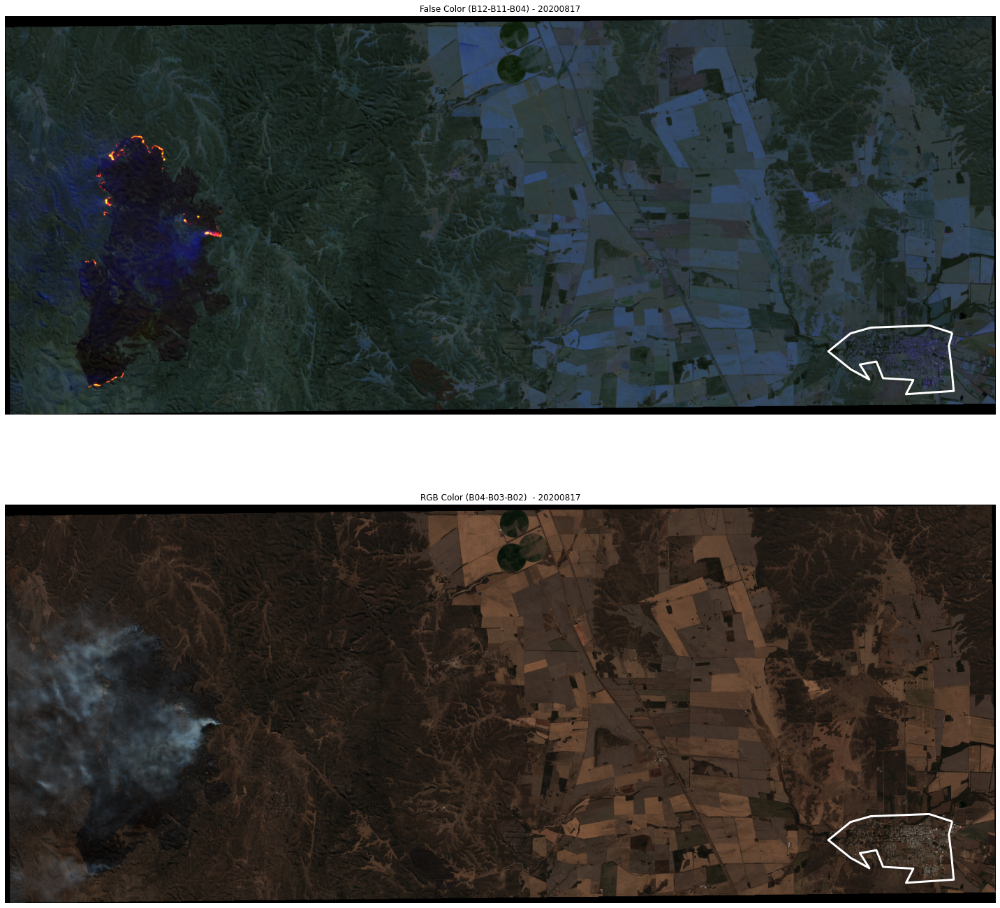

In [48]:
#hide_input
date_='20200817'
f,ax=plt.subplots(2,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[0])
ax[0].set_title('False Color (B12-B11-B04) - '+date_)
gpd_vt_proj.plot(ax=ax[0],facecolor='None',edgecolor='white',lw=3)
ax[0].axis('off')
#
r=rio.open(cases_dict['rgb_20200817.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[1])
ax[1].set_title('RGB Color (B04-B03-B02)  - '+date_)
gpd_vt_proj.plot(ax=ax[1],facecolor='None',edgecolor='white',lw=3)
ax[1].axis('off')
plt.tight_layout()
plt.savefig(products+os.sep+'img_fc_rgb_'+date_+'.png',dpi=300,transparent=True,bbox_inches='tight')

Ahora vamos a estimar (en forma muy aproximada) el area afectada. Para ello nos valemos de la banda 11. Vemos que es la que mayor contraste parece tener

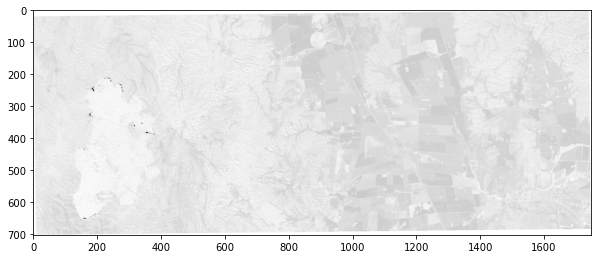

In [8]:
#hide_input
f,ax=plt.subplots(1,1,figsize=(10,10))
r=rio.open(cases_dict['false_color_urban_20200817.tiff'])
plot.show(r.read(2),ax=ax,cmap='Greys')
#close raster
r.close()

Analizamos los valores y efectuamos el "thresholding" con el fin de quedarnos con una imagen en blanco y negro.

In [9]:
#collapse
file_path_threshold=os.path.join(products_tmp,'thresholding_b11_20200817.tif')
check_file(file_path_threshold)
!gdal_calc.py --calc="A>1400" -A 'products/false_color_urban_20200817_NOTScaled.tiff' --A_band=2 --outfile={file_path_threshold} --quiet

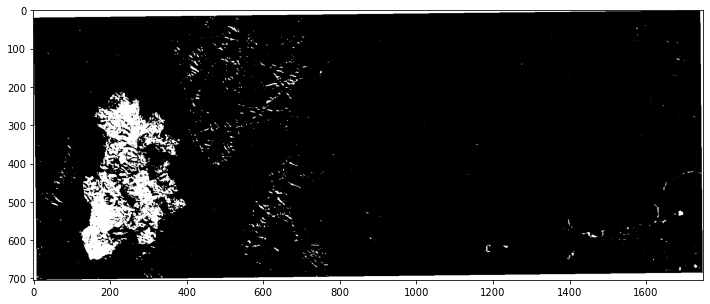

In [10]:
#hide_input
f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_threshold)
plot.show(r.read(1),cmap='Greys',ax=ax)
r.close()

Vemos que si bien remarcamos la mayoria de la zona, quedan algunas extras. Las intentamos remover e invertimos la imagen.

In [11]:
#collapse
file_path_sieved=os.path.join(products_tmp,'thresholding_b11_sieved_20200817.tif')
check_file(file_path_sieved)
!gdal_sieve.py {file_path_threshold} {file_path_sieved} -st 10

0...10...20...30...40...50...60...70...80...90...100 - done.


<AxesSubplot:>

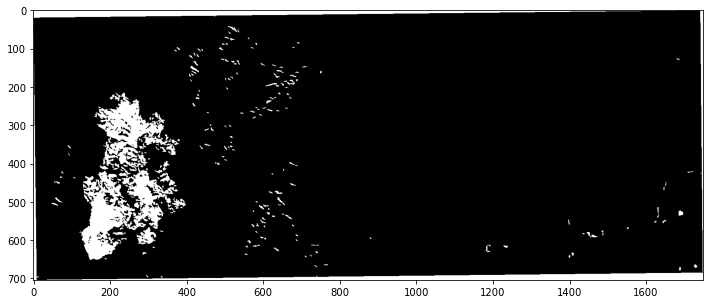

In [12]:
#hide_input
f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_sieved)
plot.show(r.read(1),cmap='Greys',ax=ax)

<AxesSubplot:>

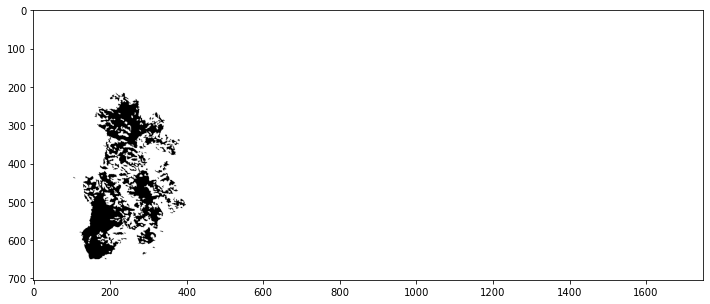

In [13]:
#hide_input
## Las zonas blancas en los bordes nos van a molestar, asique nos "ensuciamos las manos"
fire=np.ones(r.read(1).shape)
fire[200:650,100:400]=r.read(1)[200:650,100:400]
fire=np.where(fire==0,1,0)
f,ax=plt.subplots(1,1,figsize=(12,12))
plot.show(fire,cmap='Greys',ax=ax)

In [14]:
#hide
raster_to_shape=os.path.join(products_tmp,'raster_to_shape_20200817.tif')
write_array_single(file_path_sieved,raster_to_shape,fire)

Obtenemos el vector con la zona afectada via gdal-polygonize y visualizamos tanto el raster como el shapefile.

In [15]:
#collapse
vector_fire_sieved=os.path.join(products_tmp,'fire_shape_20200817.shp')
!gdal_polygonize.py {raster_to_shape} {vector_fire_sieved}

0...10...20...30...40...50...60...70...80...90...100 - done.


In [16]:
#hide
vector_fire_sieved=os.path.join(products_tmp,'fire_shape_20200817.shp')
gpd_fire=gpd.read_file(vector_fire_sieved)

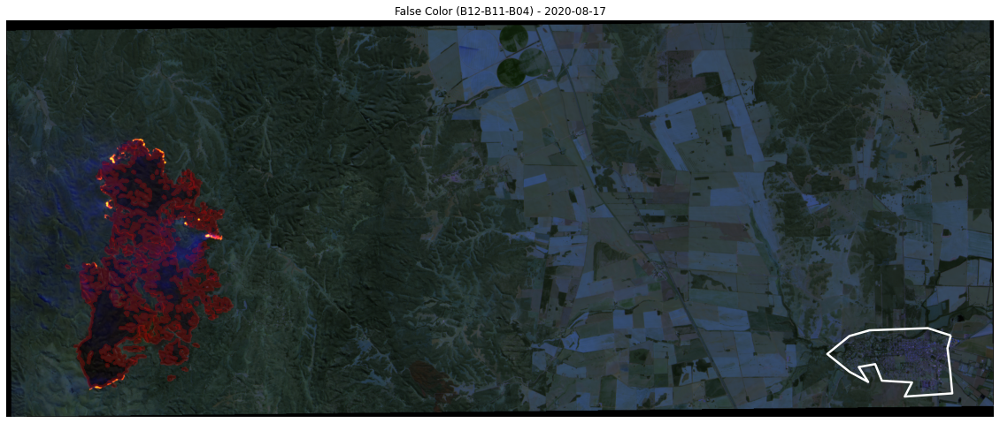

In [49]:
#hide
f,ax=plt.subplots(1,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_20200817.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax)
ax.set_title('False Color (B12-B11-B04) - 2020-08-17')
ax.axis('off')
gpd_fire.plot(ax=ax,facecolor='None',edgecolor='red',lw=3,alpha=0.2)
gpd_vt_proj.plot(ax=ax,facecolor='None',edgecolor='white',lw=2.5)
plt.savefig(products+os.sep+'img_fc_shape_detailed_20200817.png',dpi=300,transparent=True,bbox_inches='tight')

In [18]:
#hide
vt_hectareas=(gpd_vt_proj.area/100**2)[0]
fuego_hectareas=(gpd_fire.area/100**2).sum()
#
resume=products+os.sep+'resume.txt'
with open(resume,'w') as f:
    f.write('Villa del Totoral: {}[hectareas]'.format(vt_hectareas))
    f.write('\n')
    f.write('Fuego: {}[hectareas]'.format(fuego_hectareas))

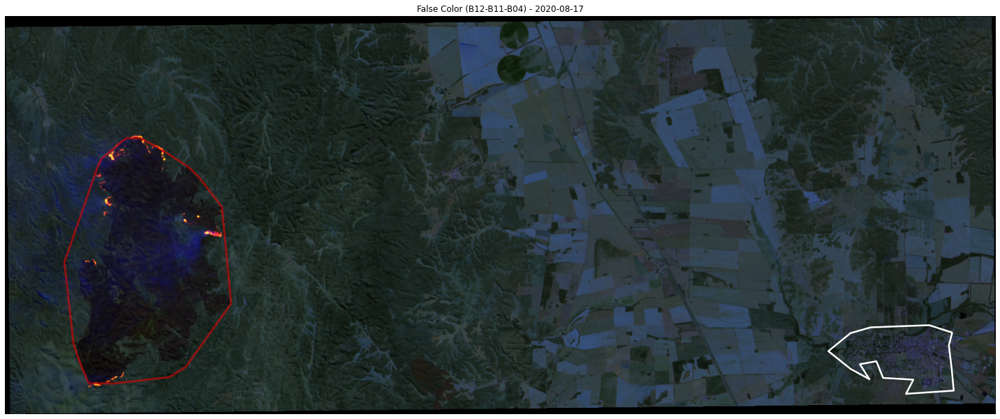

In [19]:
#hide_input
f,ax=plt.subplots(1,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_20200817.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax,cmap='YlGn',adjust='linear')
ax.set_title('False Color (B12-B11-B04) - 2020-08-17')
gpd_fire.dissolve(by='DN').convex_hull.plot(ax=ax,facecolor='None',edgecolor='red',lw=3,alpha=0.5)
gpd_vt_proj.plot(ax=ax,facecolor='None',edgecolor='white',lw=2.5)
ax.axis('off')
plt.tight_layout()
plt.savefig('products/fc_simplified_shapes.png',dpi=300,transparent=True,bbox_inches='tight')

### 2020-08-15

Realizamos un procesamiento similar (sin estimación de areas) para una fecha anterior a modo de contraste.

In [20]:
#hide
file=zip_20200815
date_='20200815'
dirtmp=tempfile.mkdtemp()
with zipfile.ZipFile(file,"r") as zip_ref:
    zip_ref.extractall(dirtmp)

#
# instanciamos el proc
bp=bands_etl()
# incluimos la capa vectorial
bp.set_mask_from_gpd(gpd_va_proj.geometry)
# Obtenemos los paths
paths,_=bp.get_band_paths(dirtmp, pattern_=['*B0?_10m.jp2','*B1?_20m.jp2'])
#
# Debido a las diferencias en el pixel size de la bandas debemos resamplear
resampled_bands={}
for band in paths:
    case='_'+date_+'_Resampled'
    name=os.path.join(products_tmp,band+case)
    resampled_bands.update({band:name})
    bp.basic_resampling(paths[band],name)
#
shutil.rmtree(dirtmp)
# seteamos las bandas
bp.set_band_names(resampled_bands)
# Generamos los parametros para el recorte
bp.get_clipping_params('B02')
#
case='false_color_urban_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='false_color_urban_'+date_+'_NOTScaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

#
case='rgb_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='rgb_'+date_+'_NOTSCaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

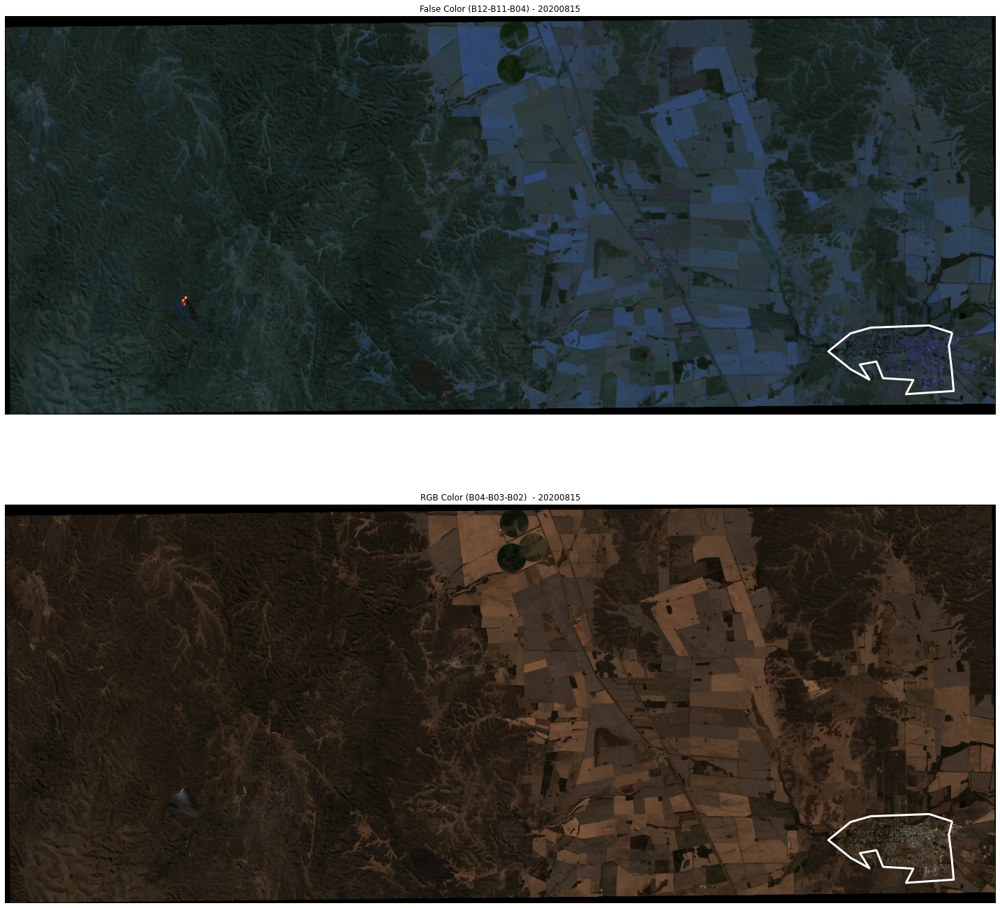

In [47]:
#hide_input
date_='20200815'
f,ax=plt.subplots(2,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[0])
ax[0].set_title('False Color (B12-B11-B04) - '+date_)
gpd_vt_proj.plot(ax=ax[0],facecolor='None',edgecolor='white',lw=3)
ax[0].axis('off')
#
r=rio.open(cases_dict['rgb_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[1])
ax[1].set_title('RGB Color (B04-B03-B02)  - '+date_)
gpd_vt_proj.plot(ax=ax[1],facecolor='None',edgecolor='white',lw=3)
ax[1].axis('off')
plt.tight_layout()
plt.savefig(products+os.sep+'img_fc_rgb_'+date_+'.png',dpi=300,transparent=True,bbox_inches='tight')

## 2020-08-20

Observamos la evolución al día 20/08. El procesamiento es similar, en este caso solo extendimos el shape original para enmarcar la zona.

In [22]:
#hide
vector_file='data/villa_albertina_20200820.geojson'
gpd_va=gpd.read_file(vector_file)
gpd_va_proj = gpd_va.to_crs(epsg=32720)

In [23]:
#hide
file=zip_20200820
date_='20200820'
dirtmp=tempfile.mkdtemp()
with zipfile.ZipFile(file,"r") as zip_ref:
    zip_ref.extractall(dirtmp)

#
# instanciamos el proc
bp=bands_etl()
# incluimos la capa vectorial
bp.set_mask_from_gpd(gpd_va_proj.geometry)
# Obtenemos los paths
paths,_=bp.get_band_paths(dirtmp, pattern_=['*B0?_10m.jp2','*B1?_20m.jp2'])
#
# Debido a las diferencias en el pixel size de la bandas debemos resamplear
resampled_bands={}
for band in paths:
    case='_'+date_+'_Resampled'
    name=os.path.join(products_tmp,band+case)
    resampled_bands.update({band:name})
    bp.basic_resampling(paths[band],name)
#
shutil.rmtree(dirtmp)
# seteamos las bandas
bp.set_band_names(resampled_bands)
# Generamos los parametros para el recorte
bp.get_clipping_params('B02')


In [24]:
#hide
case='false_color_urban_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='false_color_urban_'+date_+'_NOTScaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

#
case='rgb_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='rgb_'+date_+'_NOTSCaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

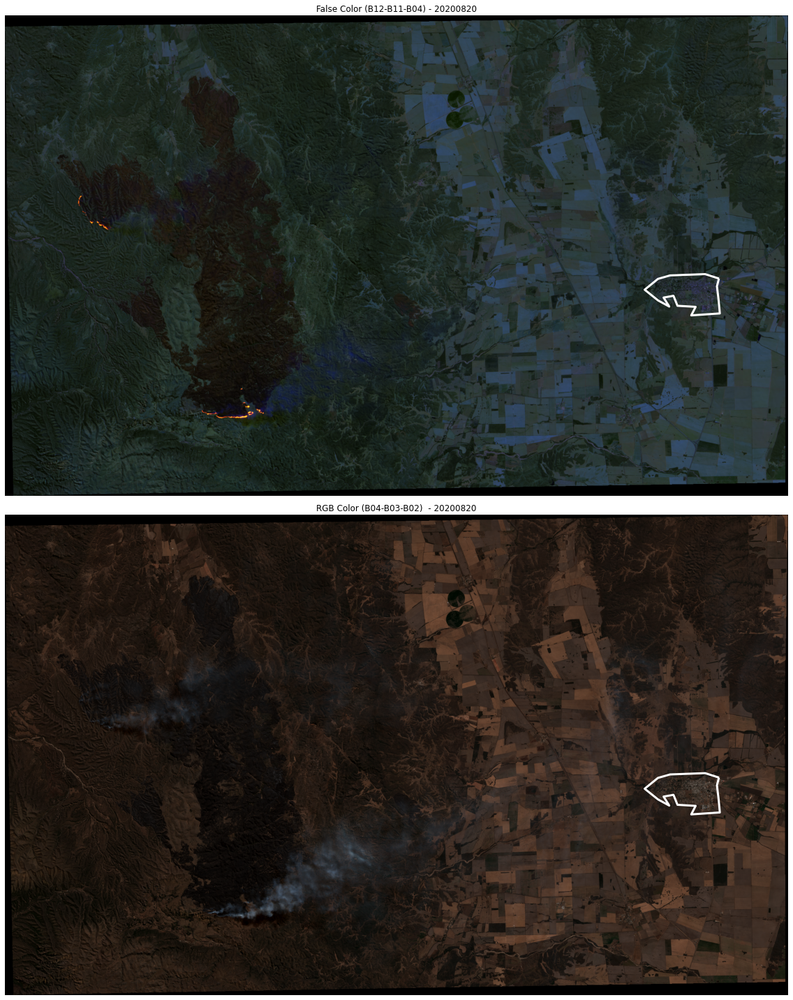

In [25]:
#hide_input
date_='20200820'
f,ax=plt.subplots(2,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[0])
ax[0].set_title('False Color (B12-B11-B04) - '+date_)
gpd_vt_proj.plot(ax=ax[0],facecolor='None',edgecolor='white',lw=3)
ax[0].axis('off')
#
r=rio.open(cases_dict['rgb_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[1])
ax[1].set_title('RGB Color (B04-B03-B02)  - '+date_)
gpd_vt_proj.plot(ax=ax[1],facecolor='None',edgecolor='white',lw=3)
ax[1].axis('off')
plt.tight_layout()
plt.savefig(products+os.sep+'img_fc_rgb_'+date_+'.png',dpi=300,transparent=True,bbox_inches='tight')

Estimamos nuevamente el area afectada

<AxesSubplot:>

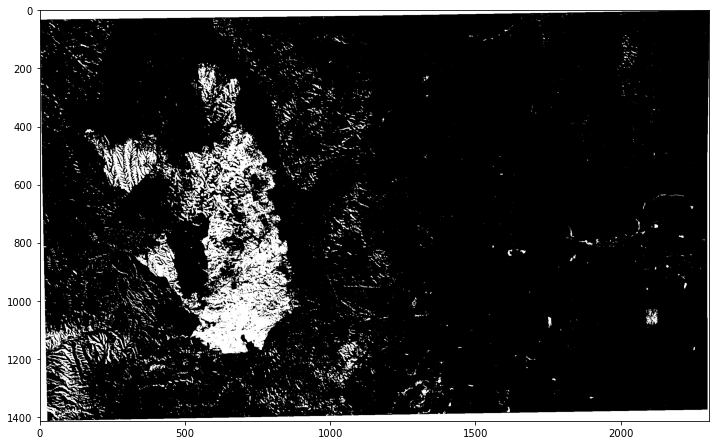

In [26]:
#hide
file_path_threshold=os.path.join(products_tmp,'thresholding_b11_20200820.tif')
check_file(file_path_threshold)
!gdal_calc.py --calc="A>1400" -A 'products/false_color_urban_20200820_NOTScaled.tiff' --A_band=2 --outfile={file_path_threshold} --quiet

f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_threshold)
plot.show(r.read(1),cmap='Greys',ax=ax)

0...10...20...30...40...50...60...70...80...90...100 - done.


<AxesSubplot:>

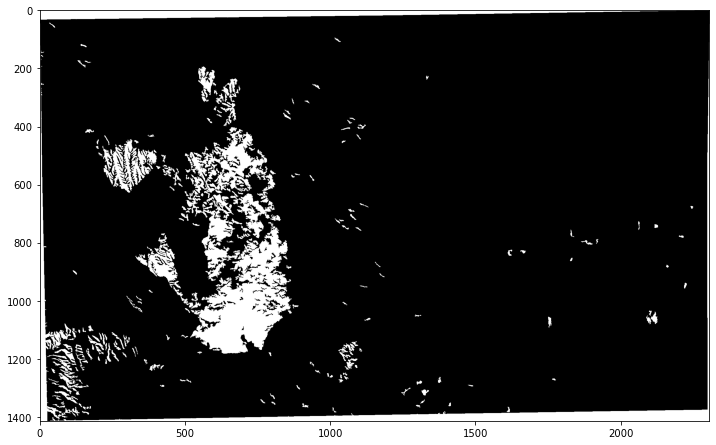

In [27]:
#hide
file_path_sieved=os.path.join(products_tmp,'thresholding_b11_sieved_20200820.tif')
check_file(file_path_sieved)
!gdal_sieve.py {file_path_threshold} {file_path_sieved} -st 50
#
f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_sieved)
plot.show(r.read(1),cmap='Greys',ax=ax)

<AxesSubplot:>

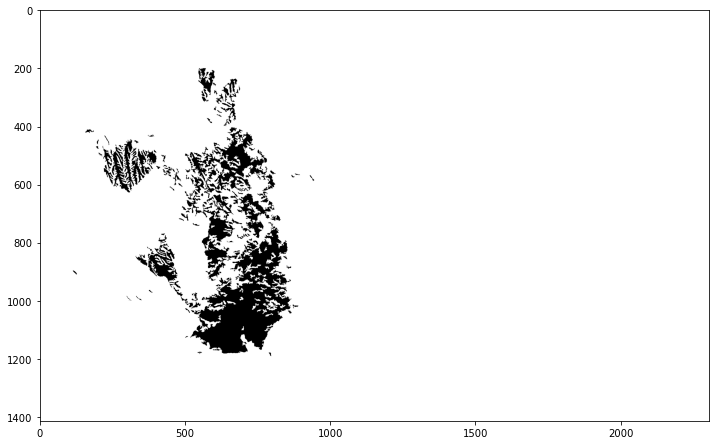

In [28]:
#hide_input
# Las zonas blancas en los bordes nos van a molestar, asique nos "ensuciamos las manos"
fire=np.ones(r.read(1).shape)
fire[200:1200,100:1000]=r.read(1)[200:1200,100:1000]
fire=np.where(fire==0,1,0)
fire[1000:,0:500]=0
fire[200:400,800:]=0
f,ax=plt.subplots(1,1,figsize=(12,12))
plot.show(fire,cmap='Greys',ax=ax)

In [29]:
#hide
raster_to_shape=os.path.join(products_tmp,'raster_to_shape_20200820.tif')
write_array_single(file_path_sieved,raster_to_shape,fire)

vector_fire_sieved=os.path.join(products_tmp,'fire_shape_20200820.shp')
!gdal_polygonize.py {raster_to_shape} {vector_fire_sieved}

gpd_fire_20200820=gpd.read_file(vector_fire_sieved)

0...10...20...30...40...50...60...70...80...90...100 - done.


In [30]:
#hide
vector_fire_sieved=os.path.join(products_tmp,'fire_shape_20200820.shp')
gpd_fire_20200820=gpd.read_file(vector_fire_sieved)

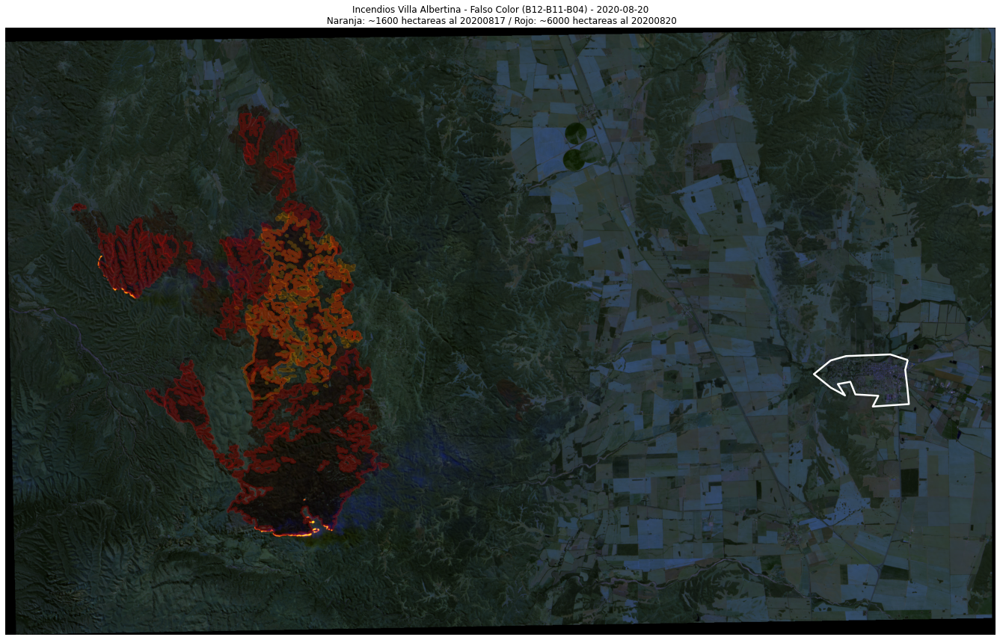

In [31]:
#hide
f,ax=plt.subplots(1,1,figsize=(20,12))
r=rio.open(cases_dict['false_color_urban_20200820.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax,cmap='YlGn',adjust='linear')
ax.set_title('Incendios Villa Albertina - Falso Color (B12-B11-B04) - 2020-08-20' '\n Naranja: ~1600 hectareas al 20200817 / Rojo: ~6000 hectareas al 20200820')
gpd_fire.plot(ax=ax,facecolor='None',edgecolor='orange',lw=3,alpha=0.2)
gpd_fire_20200820.plot(ax=ax,facecolor='None',edgecolor='red',lw=3,alpha=0.2)
gpd_vt_proj.plot(ax=ax,facecolor='None',edgecolor='white',lw=2.5)
ax.axis('off')
plt.tight_layout()
plt.savefig('products/fc_simplified_shapes_20200820.png',dpi=150,transparent=True,bbox_inches='tight')

In [32]:
#hide
vt_hectareas=(gpd_vt_proj.area/100**2)[0]
fuego_hectareas=(gpd_fire.area/100**2).sum()
fuego_hectareas_20200820=(gpd_fire_20200820.area/100**2).sum()
#
resume=products+os.sep+'resume.txt'
with open(resume,'w') as f:
    f.write('Villa del Totoral: {:.1f}[hectareas]'.format(vt_hectareas))
    f.write('\n')
    f.write('Fuego 20200817: {:.1f}[hectareas]'.format(fuego_hectareas))
    f.write('\n')
    f.write('Fuego 20200820: {:.1f}[hectareas]'.format(fuego_hectareas_20200820))

# 2020-08-22

Observamos la zona afectada al 22/08

In [33]:
#hide
vector_file='data/villa_albertina_20200820.geojson'
gpd_va=gpd.read_file(vector_file)
gpd_va_proj = gpd_va.to_crs(epsg=32720)

In [34]:
#
file=zip_20200822
date_='20200822'
dirtmp=tempfile.mkdtemp()
with zipfile.ZipFile(file,"r") as zip_ref:
    zip_ref.extractall(dirtmp)

#
# instanciamos el proc
bp=bands_etl()
# incluimos la capa vectorial
bp.set_mask_from_gpd(gpd_va_proj.geometry)
# Obtenemos los paths
paths,_=bp.get_band_paths(dirtmp, pattern_=['*B0?_10m.jp2','*B1?_20m.jp2'])
#
# Debido a las diferencias en el pixel size de la bandas debemos resamplear
resampled_bands={}
for band in paths:
    case='_'+date_+'_Resampled'
    name=os.path.join(products_tmp,band+case)
    resampled_bands.update({band:name})
    bp.basic_resampling(paths[band],name)
#
shutil.rmtree(dirtmp)
# seteamos las bandas
bp.set_band_names(resampled_bands)
# Generamos los parametros para el recorte
bp.get_clipping_params('B02')


In [35]:
case='false_color_urban_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='false_color_urban_'+date_+'_NOTScaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B12','B11','B04'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

#
case='rgb_'+date_+'.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=True)
cases_dict.update({case:tiff_name_})
#
case='rgb_'+date_+'_NOTSCaled.tiff'
tiff_name_=os.path.join(products,case)
bp.bands_clipped_to_tiff(['B04','B03','B02'],tiff_name_=tiff_name_,scale_band=False)
cases_dict.update({case:tiff_name_})

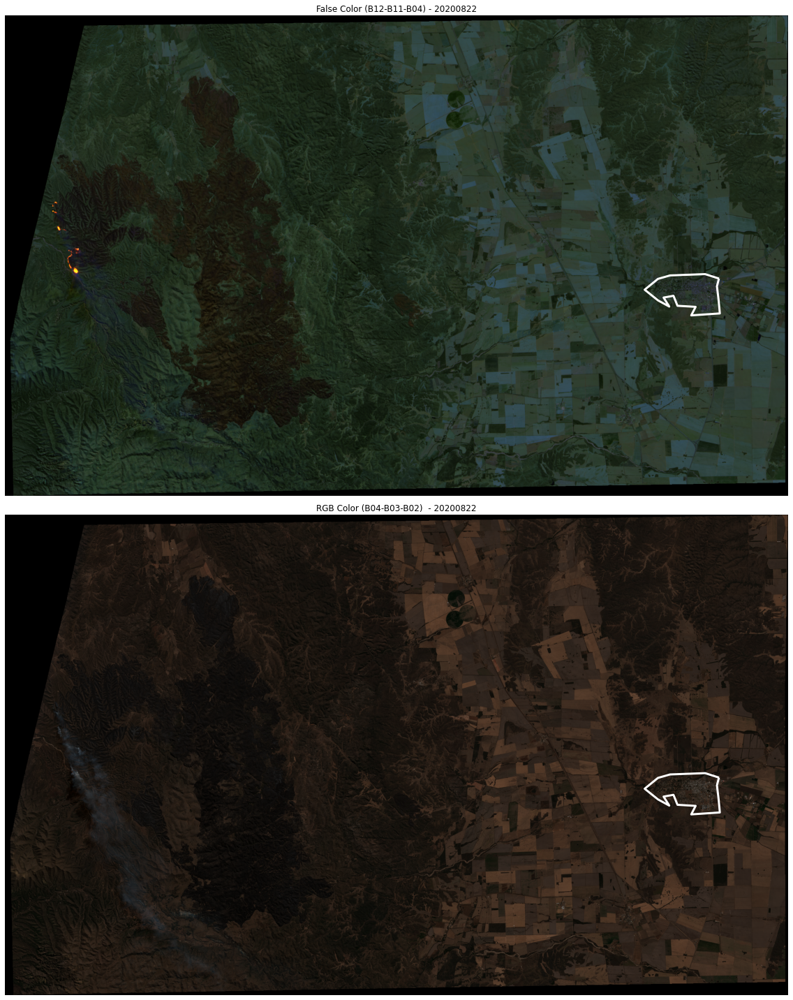

In [36]:
#hide_input
date_='20200822'
f,ax=plt.subplots(2,1,figsize=(20,20))
r=rio.open(cases_dict['false_color_urban_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[0])
ax[0].set_title('False Color (B12-B11-B04) - '+date_)
gpd_vt_proj.plot(ax=ax[0],facecolor='None',edgecolor='white',lw=3)
ax[0].axis('off')
#
r=rio.open(cases_dict['rgb_'+date_+'.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax[1])
ax[1].set_title('RGB Color (B04-B03-B02)  - '+date_)
gpd_vt_proj.plot(ax=ax[1],facecolor='None',edgecolor='white',lw=3)
ax[1].axis('off')
plt.tight_layout()
plt.savefig(products+os.sep+'img_fc_rgb_'+date_+'.png',dpi=300,transparent=True,bbox_inches='tight')

Observamos que todavia permanecen algunos focos activos.

Estimamos el area afectada

<AxesSubplot:>

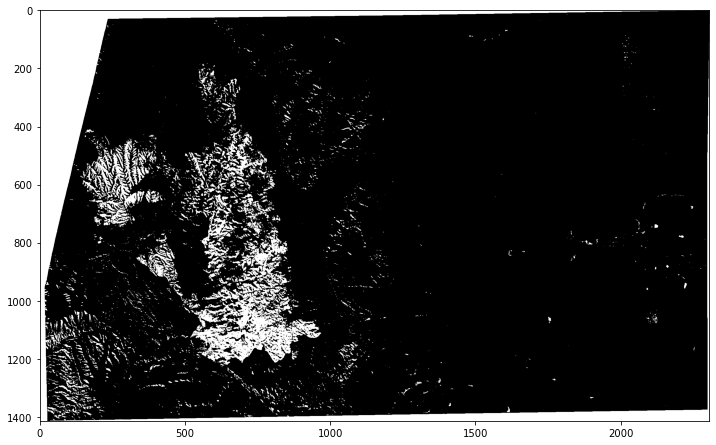

In [37]:
#hide
file_path_threshold=os.path.join(products_tmp,'thresholding_b11_20200822.tif')
check_file(file_path_threshold)
!gdal_calc.py --calc="A>1400" -A 'products/false_color_urban_20200822_NOTScaled.tiff' --A_band=2 --outfile={file_path_threshold} --quiet

f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_threshold)
plot.show(r.read(1),cmap='Greys',ax=ax)

0...10...20...30...40...50...60...70...80...90...100 - done.


<AxesSubplot:>

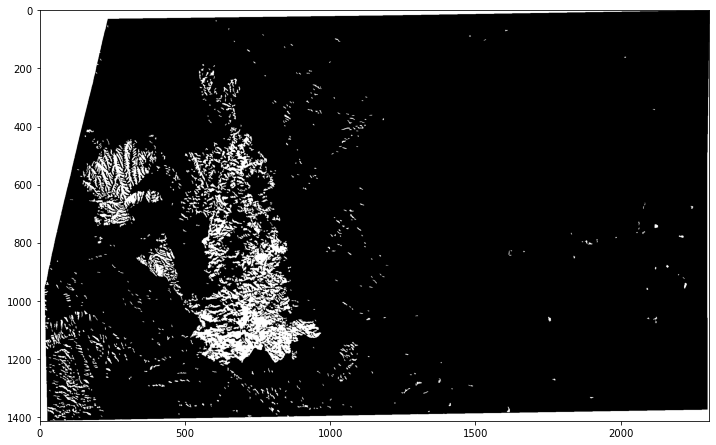

In [38]:
#hide
file_path_sieved=os.path.join(products_tmp,'thresholding_b11_sieved_20200822.tif')
check_file(file_path_sieved)
!gdal_sieve.py {file_path_threshold} {file_path_sieved} -st 10
#
f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(file_path_sieved)
plot.show(r.read(1),cmap='Greys',ax=ax)

<AxesSubplot:>

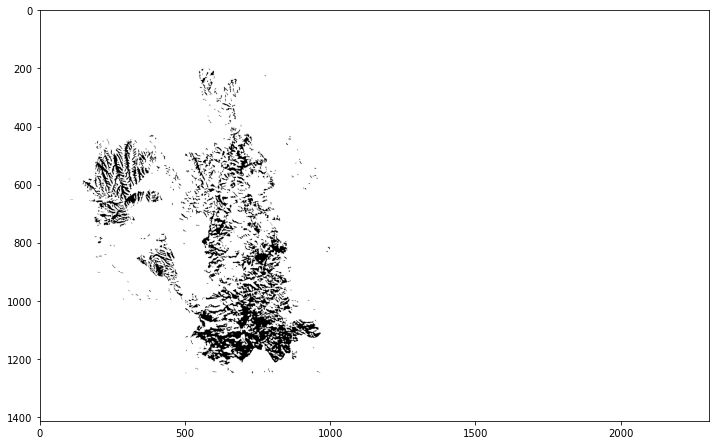

In [39]:
#hide_input
# Las zonas blancas en los bordes nos van a molestar, asique nos "ensuciamos las manos"
fire=np.ones(r.read(1).shape)
fire[200:1250,100:1000]=r.read(1)[200:1250,100:1000]
fire=np.where(fire==0,1,0)
fire[1000:,0:500]=0
fire[200:400,800:]=0
fire[200:400,100:200]=0
fire[400:580,100:190]=0
fire[800:1000,100:190]=0
f,ax=plt.subplots(1,1,figsize=(12,12))
plot.show(fire,cmap='Greys',ax=ax)

In [40]:
#hide
raster_to_shape=os.path.join(products_tmp,'raster_to_shape_20200822.tif')
write_array_single(file_path_sieved,raster_to_shape,fire)

vector_fire_sieved=os.path.join(products_tmp,'fire_shape_20200822.shp')
!gdal_polygonize.py {raster_to_shape} {vector_fire_sieved}

gpd_fire_20200822=gpd.read_file(vector_fire_sieved)

0...10...20...30...40...50...60...70...80...90...100 - done.


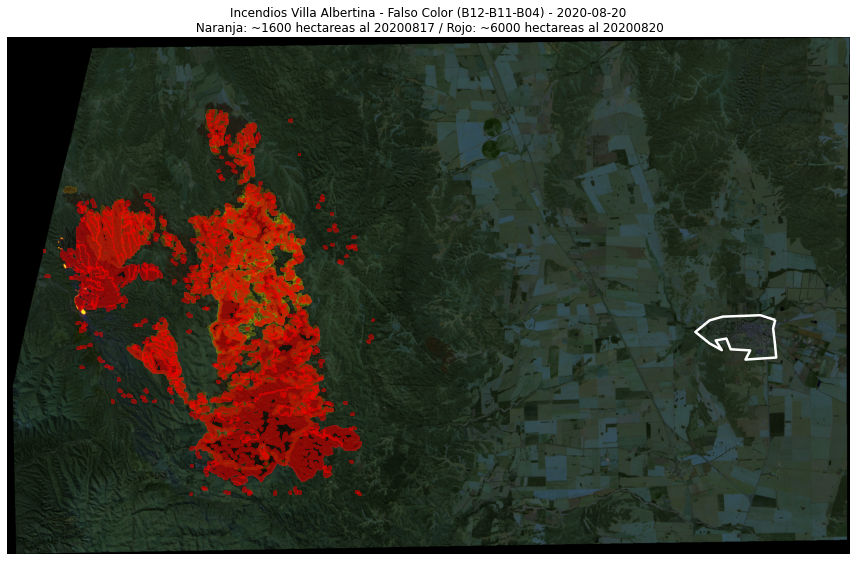

In [41]:
#hide_input
f,ax=plt.subplots(1,1,figsize=(12,12))
r=rio.open(cases_dict['false_color_urban_20200822.tiff'])
plot.show(r.read(),transform=r.transform,ax=ax,cmap='YlGn',adjust='linear')
ax.set_title('Incendios Villa Albertina - Falso Color (B12-B11-B04) - 2020-08-20' '\n Naranja: ~1600 hectareas al 20200817 / Rojo: ~6000 hectareas al 20200820')
gpd_fire.plot(ax=ax,facecolor='None',edgecolor='yellow',lw=3,alpha=0.2)
gpd_fire_20200820.plot(ax=ax,facecolor='None',edgecolor='orange',lw=3,alpha=0.2)
gpd_fire_20200822.plot(ax=ax,facecolor='None',edgecolor='red',lw=3,alpha=0.5)
gpd_vt_proj.plot(ax=ax,facecolor='None',edgecolor='white',lw=2.5)

ax.axis('off')
plt.tight_layout()
plt.savefig('products/fc_simplified_shapes_20200822.png',dpi=150,transparent=True,bbox_inches='tight')

In [42]:
#hide
vt_hectareas=(gpd_vt_proj.area/100**2)[0]
fuego_hectareas=(gpd_fire.area/100**2).sum()
fuego_hectareas_20200820=(gpd_fire_20200820.area/100**2).sum()
fuego_hectareas_20200822=(gpd_fire_20200822.area/100**2).sum()
#
resume=products+os.sep+'resume.txt'
with open(resume,'w') as f:
    f.write('Villa del Totoral: {:.1f}[hectareas]'.format(vt_hectareas))
    f.write('\n')
    f.write('Fuego 20200817: {:.1f}[hectareas]'.format(fuego_hectareas))
    f.write('\n')
    f.write('Fuego 20200820: {:.1f}[hectareas]'.format(fuego_hectareas_20200820))
    f.write('\n')
    f.write('Fuego 20200822: {:.1f}[hectareas]'.format(fuego_hectareas_20200822))

#### Alternativa para el computo de area afectada

En este caso podemos estimar el area via el [NBR](https://www.earthdatascience.org/courses/earth-analytics/multispectral-remote-sensing-modis/normalized-burn-index-dNBR/) (Normalized Burn Ratio). Computamos el indice (_bands_etl().ndi_to_tiff_). Efectuamos el thresholding poligonizamos y generamos el area ( en este caso para el dia 22/08)

In [43]:
#hide
bp.ndi_to_tiff('B12','B08',weight=[0.001,0.001],nodata=-10000)

/home/lix/miniconda3/envs/incendioVA/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in true_divide
  if __name__ == '__main__':
/home/lix/miniconda3/envs/incendioVA/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':


In [44]:
#hide
file_path_threshold=os.path.join(products_tmp,'test.tif')
check_file(file_path_threshold)
!gdal_calc.py --calc="A*(A>0)" -A 'ndi.tiff' --outfile={file_path_threshold} --quiet --type='Byte' --NoDataValue=0
file_path_sieved=os.path.join(products_tmp,'test_sieved.tif')
!gdal_sieve.py {file_path_threshold} {file_path_sieved} -st 100

vector_fire_sieved_alt=os.path.join(products_tmp,'fire_shape_20200822_alt.shp')
!gdal_polygonize.py {file_path_sieved} {vector_fire_sieved_alt}

0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output products/tmp/fire_shape_20200822_alt.shp of format ESRI Shapefile.
0...10...20...30...40...50...60...70...80...90...100 - done.


(355706.0, 386814.0, 6570194.0, 6620926.0)

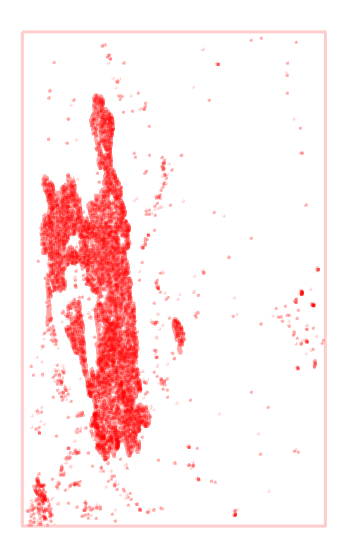

In [46]:
#hide_input
gpd_alt=gpd.read_file(vector_fire_sieved_alt)
ax=gpd_alt.plot(figsize=(20,10),facecolor='None',edgecolor='red',lw=3,alpha=0.2)
ax.axis('off')